# Assignment: forward kinematics of a Thymio
The provided dataset represents the motion from the two wheels of a thymio, as measured through a pretty inaccurate method based on the observed voltages of the two motors (i.e. not a wheel encoder).



Each 0.1s, you get a reading that represents the total amount of rotation of the left and right wheels, since an arbitrary starting point in the past; the value corresponds to the total displacement, in meters, at the edge of each wheel (this already takes into account the wheel radius).
The distance between the wheels is $2l = 9.35$ cm.
# Filippo Casari Assignment




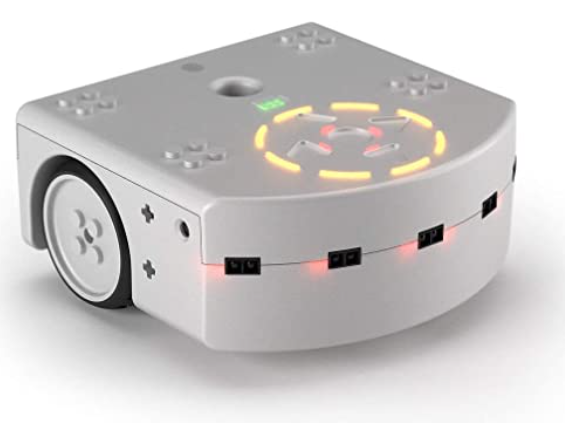

## Data import

In [1]:
# Preparation
import pandas as pd
import numpy as np
np.set_printoptions(precision=4, suppress=True)
import matplotlib.pyplot as plt
import ipywidgets

def mktr(x, y):
    return np.array([[1, 0, x],
                     [0, 1, y],
                     [0, 0, 1]])


def mkrot(theta):
    return np.array([[np.cos(theta), -np.sin(theta), 0],
                     [np.sin(theta),  np.cos(theta), 0],
                     [0,              0,             1]])


def drawf(f, ax=None, name=None):
    """ Draw frame defined by f on axis ax (if provided) or on plt.gca() otherwise """
    xhat = f @ np.array([[0, 0, 1], [1, 0, 1]]).T
    yhat = f @ np.array([[0, 0, 1], [0, 1, 1]]).T
    if(not ax):
        ax = plt.gca()
    ax.plot(xhat[0, :], xhat[1, :], 'r-')  # transformed x unit vector
    ax.plot(yhat[0, :], yhat[1, :], 'g-')  # transformed y unit vector
    if(name):
        ax.text(xhat[0, 0], xhat[1, 0], name, va="top", ha="center")

def drawrobot(f, l, ax=None, alpha=0.5):
    """ Draw robot at f, with wheel distance from center l,
    on axis ax (if provided) or on plt.gca() otherwise.
    if l is None, no wheels are drawn"""

    if(not ax):
        ax = plt.gca()

    robot = ([[-1, 2, -1, -1],  # x
             [-1, 0,  1, -1]])  # y
  
    robot = np.array(robot)
    robot = np.vstack((
        robot * 0.1,  # scale by 0.1 units
        np.ones((1, robot.shape[1]))))

    robott = f @ robot

    wheell = np.array([
        [-0.05, 0.05],
        [l, l],
        [1, 1]
    ])
    wheelr = wheell * np.array([[1, -1, 1]]).T
    wheellt = f @ wheell
    wheelrt = f @ wheelr
    ax.plot(robott[0, :], robott[1, :], 'k-', alpha=alpha)
    ax.plot(wheellt[0, :], wheellt[1, :], 'k-', alpha=alpha)
    ax.plot(wheelrt[0, :], wheelrt[1, :], 'k-', alpha=alpha)

def ddtr(vl, vr, l, dt):
    """ returns the pose transform for a motion with duration dt of a differential
    drive robot with wheel speeds vl and vr and wheelbase l """

    if(np.isclose(vl, vr)):  # we are moving straight, R is at the infinity and we handle this case separately
        return mktr((vr + vl)/2*dt, 0)  # note we translate along x ()

    omega = (vr - vl) / (2 * l)  # angular speed of the robot frame
    R = l * (vr + vl) / (vr - vl)

    # Make sure you understand this!
    return mktr(0, R) @ mkrot(omega * dt) @ mktr(0, -R)


        t    l_disp    r_disp
299  29.9 -9.058860 -8.372935
300  30.0 -9.058860 -8.372935
301  30.1 -9.059159 -8.372935
302  30.2 -9.059159 -8.372935
303  30.3 -9.059159 -8.372935


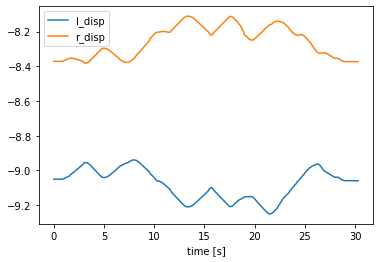

In [2]:
df = pd.read_csv("data.csv")
print(df.tail())
fig,ax = plt.subplots()
ax.plot(df["t"], df["l_disp"], label="l_disp")
ax.plot(df["t"], df["r_disp"], label="r_disp")
ax.set(xlabel = "time [s]")

ax.legend();

Observe that:
- When both lines move up, both wheels are moving forwards and the robot is advancing
- When both lines are horizontal, such as in the end, the robot is not moving
- The absolute values of each line do not matter, just their rates of change (that correspond to the tangential velocity of the wheels).

Let's now compute the tangential velocities of the two wheels, in m/s, and move to numpy arrays, that you might be more familiar with.

In [3]:
df[["l_vel","r_vel"]] = df[["l_disp","r_disp"]].diff(axis=0).fillna(0) / 0.1
l_vel, r_vel = df[["l_vel","r_vel"]].values.T
t = df["t"].values

You can now work with 1d numpy arrays `l_vel` (m/s), `r_vel` (m/s), `t` (s)

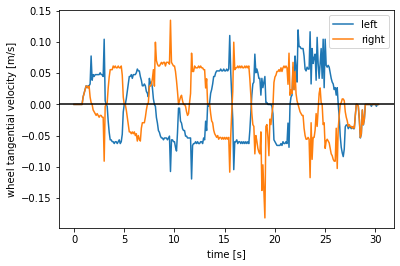

In [4]:
# Visualize to make sure the data is sane
fig,ax = plt.subplots()
ax.plot(t, l_vel, label="left")
ax.plot(t, r_vel, label="right")
ax.axhline(y=0, color="k")
ax.legend()
ax.set(xlabel="time [s]", ylabel="wheel tangential velocity [m/s]");

## Assignments

### 1: Compute and visualize the trajectory of the robot
This will require to implement the robot kinematics.
You can visualize the trajectory of the robot reference point as a line (note: you won't see the orientation of the robot!).

As a sanity check: the reference point of the robot moves within a small area (approximately $12 \times 10$ centimeters); the robot often turns in place, don't expect a long smooth trajectory.

0.09475491502565694
0.0028285395793725705


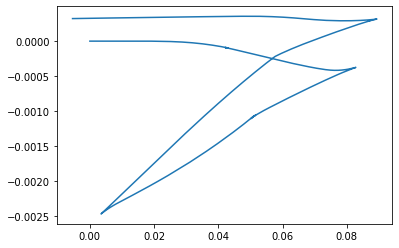

In [5]:

Ts=[np.eye(3)]
l=4.675
dt=0.1
x_array=[]
y_array=[]
for v_l,v_r in zip(df["l_vel"],df["r_vel"]):
    #print(v_r, v_l)
    Ts.append(Ts[-1] @ ddtr(v_l, v_r, l, dt))
    xy=Ts[-1][:2, 2]
    x=xy[0]
    y=xy[1]
    x_array.append(x)
    y_array.append(y)
    #print(Ts[-1][:2, 2])
plt.plot(x_array, y_array)
x_array_no_noise=np.array(x_array)
y_array_no_noise=np.array(y_array)
print(abs(min(x_array)-max(x_array)))
print(abs(min(y_array)-max(y_array)))

### 2: visualize the trajectory as an animation
Draw the robot and its orientation as a dot with a short line to indicate the direction it is facing.

To visualize the animation using matplotlib, have a look [here](https://matplotlib.org/stable/gallery/animation/simple_anim.html).

In [6]:

%matplotlib notebook

import matplotlib
Ts=[np.eye(3)]
l=4.675
dt=0.1
x_array=[]
y_array=[]

for v_l,v_r in zip(df["l_vel"],df["r_vel"]):
    #print(v_r, v_l)
    Ts.append(Ts[-1] @ ddtr(v_l, v_r, l, dt))
    xy=Ts[-1][:2, 2]
    x=xy[0]
    y=xy[1]
    x_array.append(x)
    y_array.append(y)
    
    #lines=(np.interp(np.linspace(0,30),x_array[-2:], y_array[-2:] ))
    
    #print(Ts[-1][:2, 2])
#lines=(np.interp(np.linspace(0,30),x_array[-2:], y_array[-2:] ))
x_array=np.array(x_array)
y_array=np.array(y_array)
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()



def animate(t):
    plt.cla()
    plt.plot(x_array[t], y_array[t], marker='*')
    plt.xlim(min(x_array),max(x_array))
    plt.ylim(min(y_array),max(y_array))
    plt.plot(x_array[:t+1], y_array[:t+1], color='red')
 
    
    if(t!=len(x_array)-1 or t!=0):
        length_arrow=np.sqrt(((x_array[t]-x_array[t-1])**2)+(y_array[t]-y_array[t-1])**2)
        if(length_arrow<10e-5):
            length_arrow=10e-4
        plt.arrow(x_array[t], y_array[t], x_array[t]-x_array[t-1], y_array[t]-y_array[t-1], head_width=0.0001, head_length=length_arrow, width=0.00003)
    
print(df.head())



     t    l_disp    r_disp  l_vel  r_vel
0  0.0 -9.050185 -8.371172    0.0    0.0
1  0.1 -9.050185 -8.371172    0.0    0.0
2  0.2 -9.050185 -8.371172    0.0    0.0
3  0.3 -9.050185 -8.371172    0.0    0.0
4  0.4 -9.050185 -8.371172    0.0    0.0


In [7]:
fig, ax = plt.subplots()

matplotlib.animation.FuncAnimation(fig, animate, frames=len(x_array),interval=100  )

AttributeError: module 'matplotlib' has no attribute 'animation'

### 3: account for uncertainty
Also estimate the accumulating uncertainty of the robot pose (with respect to its initial pose).

As a cheap way to do so, implement a Monte Carlo approach.  Compute 100 replicas of the trajectory; in each, you can corrupt the displacement (or velocity) measured at each timestep with a multiplicative gaussian i.i.d noise $k \sim \mathcal{N}(\mu, \sigma^2)$ with $\mu = 1$ and $\sigma = 0.1$.

/Users/filippocasari/Library/Python/3.8/lib/python/site-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


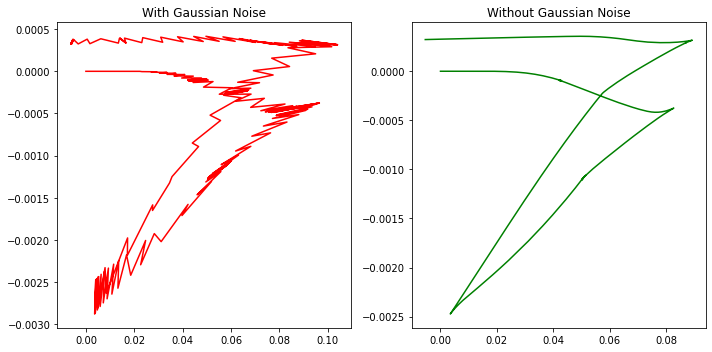

In [ ]:
%matplotlib inline



fig, ax=plt.subplots(ncols=2, nrows=1, figsize=(10,5))

new_x_array=x_array.copy()

new_y_array=y_array.copy()


rand = np.random.normal(1, 0.1, 1)
for j in range(len(x_array)):
    if(j%2==0):
        new_x_array[j]=x_array[j]*rand
    else:
        new_y_array[j]=y_array[j]*rand
ax[0].plot(new_x_array, new_y_array, color='red')
ax[1].plot(x_array_no_noise, y_array_no_noise, color='green')
ax[0].set_title("With Gaussian Noise")
ax[1].set_title("Without Gaussian Noise")
ax[0].autoscale()
ax[1].autoscale()
plt.tight_layout()

    

## With Animations

In [ ]:

%matplotlib notebook
import matplotlib
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig2, ax = plt.subplots()


def animate_2(t):
    plt.cla()
    x_array=new_x_array
    y_array=new_y_array
    plt.plot(x_array[t], y_array[t], marker='*')
    plt.xlim(min(x_array)-0.001,max(x_array)+0.001)
    plt.ylim(min(y_array)-0.001,max(y_array)+0.001)
    
    plt.plot(x_array[:t+1], y_array[:t+1], color='red')
    
    #plt.autoscale()
    
    if(t!=len(x_array)-1 or t!=0):
        length_arrow=np.sqrt(((x_array[t]-x_array[t-1])**2)+(y_array[t]-y_array[t-1])**2)
        if(length_arrow<10e-5):
            length_arrow=10e-4
        plt.arrow(x_array[t], y_array[t], x_array[t]-x_array[t-1], y_array[t]-y_array[t-1], head_width=0.0001, head_length=length_arrow, width=0.00003)
    #plt.autoscale()
matplotlib.animation.FuncAnimation(fig2, animate_2, frames=len(new_x_array),interval=100  )